In [29]:
!date

Fri Apr  8 22:00:37 PDT 2022


# Cell type assignment on only EXP data
#### Unfiltered data obtained from using kb with multimapping function. Ref genome includes WRE.

___

In [30]:
%config InlineBackend.figure_format = 'retina'
%load_ext blackcellmagic

The blackcellmagic extension is already loaded. To reload it, use:
  %reload_ext blackcellmagic


In [31]:
import sys
import anndata
import scvi

import scanpy as sc
import numpy as np
from scipy import stats

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from plotting_funcs import violinplot

import pandas as pd

sc.set_figure_params(figsize=(6, 6), frameon=False)
sc.settings.n_jobs=2

In [32]:
# set random seed
np.random.seed(926)

In [33]:
def nd(arr):
    """
    Funciton to transform numpy matrix to nd array.
    """
    return np.asarray(arr).reshape(-1)

___

# Load clustered experiment data

In [34]:
adata = anndata.read('../../finchseq_data/exp_leiden.h5ad')
adata

AnnData object with n_obs × n_vars = 19994 × 22151
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

Create copy of adata to run rank_genes_groups on marker genes only:

In [35]:
adata_test = adata.copy()

___

# Plot fraction of each batch per cluster (after normalizing to total cellcount in each batch)

In [36]:
colors = ["#e66101", "#fdb863"]

In [37]:
# Normalize each celltype count to total number of cells in that batch by dividing
df_experiment = (adata.obs.groupby("leiden")["batch"].value_counts() / adata.obs.groupby("batch")["species"].count()).unstack().fillna(0)
# The above returns a categorical dataframe, so we will convert the columns to strings
df_experiment.columns = df_experiment.columns.astype(str)

df_experiment["total normalized count"] = df_experiment.sum(axis=1).values

df_experiment["experiment1_fraction"] = (df_experiment["experiment1"] / df_experiment["total normalized count"]).values
df_experiment["experiment2_fraction"] = (df_experiment["experiment2"] / df_experiment["total normalized count"]).values

df_experiment["total number of cells"] = adata.obs.groupby("leiden").size().values.astype(int)

df_experiment.head()

batch,experiment1,experiment2,total normalized count,experiment1_fraction,experiment2_fraction,total number of cells
leiden,,,,,,
0,0.134570,0.124674,0.259245,0.519086,0.480914,2569
1,0.110044,0.094320,0.204364,0.538472,0.461528,2007
2,0.079678,0.093994,0.173672,0.458785,0.541215,1769
3,0.117830,0.055501,0.173332,0.679797,0.320203,1590
4,0.083961,0.060954,0.144914,0.579381,0.420619,1396


/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  


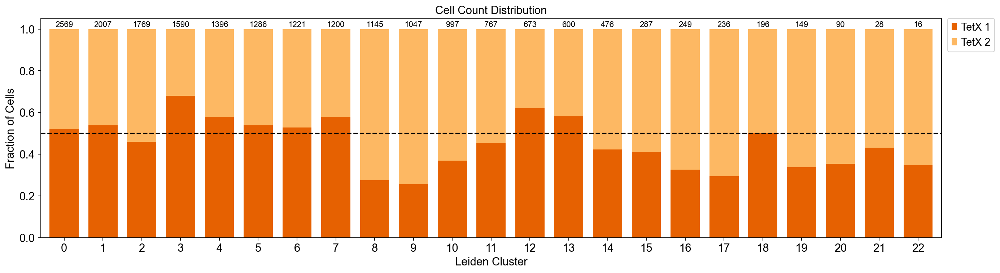

In [38]:
fig, ax = plt.subplots(figsize=(20,5))

clusters = df_experiment.index.values
width = 0.75

ax.bar(clusters, df_experiment["experiment1_fraction"].values, width, color=colors[0], label="TetX 1")
ax.bar(clusters, df_experiment["experiment2_fraction"].values, width, bottom=df_experiment["experiment1_fraction"].values, color=colors[1], label="TetX 2")

cellcounts = df_experiment["total number of cells"].values
# Add total cell count above each bar
for index, value in enumerate(cellcounts):
    ax.text(x = index, y = 1.01, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation = 0, ha="center")
ax.legend(bbox_to_anchor=(1.001, 1.025), loc='upper left')

ax.set(**{
    "title": "Cell Count Distribution",
    "ylabel": "Fraction of Cells",
    "xlabel": "Leiden Cluster"
})

ax.axhline(y=0.5, color='k', linestyle='--')

ax.margins(x=0.01)
ax.grid(False) 

fig.savefig("figures/3.4_cell_count_distribution_leiden_tetx.png", dpi=600, bbox_inches='tight')  
fig.savefig("figures/3.4_cell_count_distribution_leiden_tetx.pdf", dpi=600, bbox_inches='tight')  

fig.show()

___

# DE genes in EXP Leiden clusters

In [39]:
sc.tl.rank_genes_groups(adata, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

Score = z-score underlying the computation of a p-value for each gene for each group

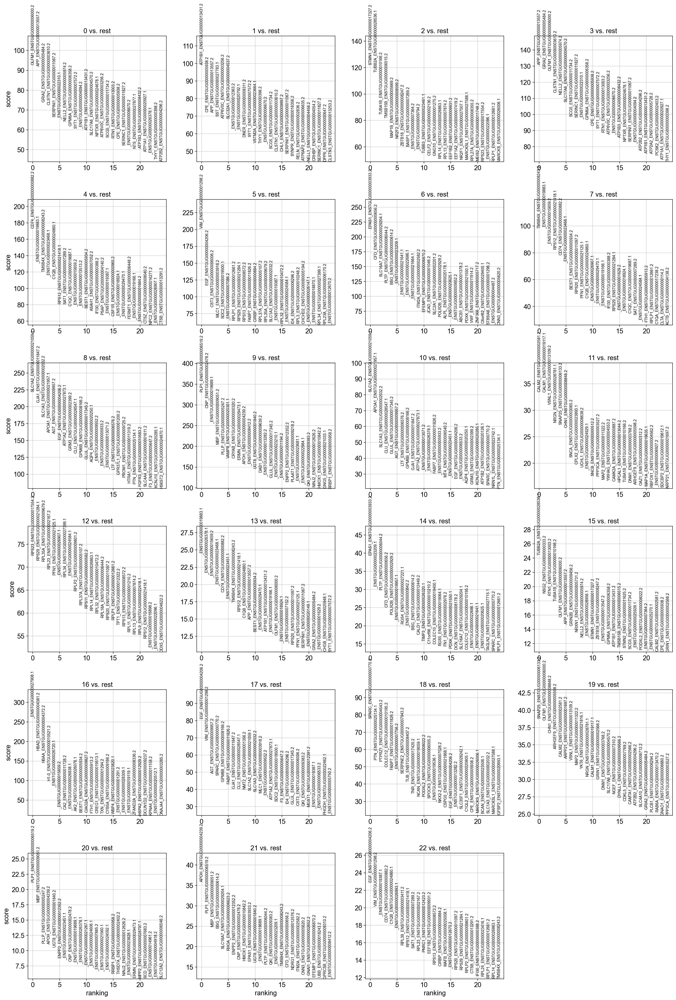

In [40]:
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, save=True)

Show the 10 top ranked genes per cluster:

In [41]:
leiden_markers = pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(25)
leiden_markers

,0,1,2,3,4,5,6,7,8,9,...,13,14,15,16,17,18,19,20,21,22
0,OLFM1_ENSTGUG00000006000.2,ATP1B1_ENSTGUG00000013431.2,STMN1_ENSTGUG00000017327.2,APP_ENSTGUG00000013557.2,CD74_ENSTGUG00000000882.2,VIM_ENSTGUG00000001298.2,EPAS1_ENSTGUG00000003933.2,TMSB4X_ENSTGUG00000008243.2,SLC1A2_ENSTGUG00000021059.1,PLP1_ENSTGUG00000006519.2,...,_ENSTGUG00000019883.1,EPAS1_ENSTGUG00000003933.2,TUBB2A_ENSTGUG00000028536.1,_ENSTGUG00000027908.1,EGF_ENSTGUG00000004206.2,SPARC_ENSTGUG00000000770.2,SNAP25_ENSTGUG00000006133.2,PLP1_ENSTGUG00000006519.2,APOH_ENSTGUG00000004239.2,EGF_ENSTGUG00000004206.2
1,APP_ENSTGUG00000013557.2,CPE_ENSTGUG00000005938.2,TUBB2A_ENSTGUG00000028536.1,GRIA2_ENSTGUG00000005484.2,_ENSTGUG00000019883.1,EGF_ENSTGUG00000004206.2,CFD_ENSTGUG00000000656.2,_ENSTGUG00000019883.1,GJA1_ENSTGUG00000011847.2,CNP_ENSTGUG00000002478.2,...,_ENSTGUG00000026378.1,_ENSTGUG00000023209.1,NSG2_ENSTGUG00000000333.2,HBAD_ENSTGUG00000004381.2,VIM_ENSTGUG00000001298.2,PTN_ENSTGUG00000025134.1,OLFM1_ENSTGUG00000006000.2,MBP_ENSTGUG00000009051.2,PLP1_ENSTGUG00000006519.2,VIM_ENSTGUG00000001298.2
2,GRIA2_ENSTGUG00000005484.2,APP_ENSTGUG00000013557.2,TUBA1B_ENSTGUG00000010166.2,OLFM1_ENSTGUG00000006000.2,TMSB4X_ENSTGUG00000008243.2,CST3_ENSTGUG00000006006.2,SLC16A7_ENSTGUG00000029204.1,_ENSTGUG00000015659.2,SLC1A3_ENSTGUG00000002032.2,_ENSTGUG00000019689.1,...,_ENSTGUG00000015659.2,PLTP_ENSTGUG00000006044.2,RTN1_ENSTGUG00000013003.2,HBAA_ENSTGUG00000004372.2,AGT_ENSTGUG00000009957.2,PTPRZ1_ENSTGUG00000004543.2,CHN1_ENSTGUG00000008848.2,PLLP_ENSTGUG00000005247.2,MBP_ENSTGUG00000009051.2,_ENSTGUG00000019387.1
3,CLSTN1_ENSTGUG00000003610.2,SST_ENSTGUG00000027783.1,TMSB15B_ENSTGUG00000006515.2,CLSTN1_ENSTGUG00000003610.2,_ENSTGUG00000023468.1,MLC1_ENSTGUG00000003918.2,PLTP_ENSTGUG00000006044.2,RPS12_ENSTGUG00000021418.1,APOA1_ENSTGUG00000021957.1,MBP_ENSTGUG00000009051.2,...,_ENSTGUG00000023468.1,CFD_ENSTGUG00000000656.2,TUBA1B_ENSTGUG00000010166.2,H1-0_ENSTGUG00000010521.2,SPARC_ENSTGUG00000000770.2,COLEC12_ENSTGUG00000010195.2,ARHGEF9_ENSTGUG00000005598.2,APOH_ENSTGUG00000004239.2,BSG_ENSTGUG00000000614.2,CD74_ENSTGUG00000000882.2
4,SERPINI1_ENSTGUG00000011067.2,ATP6V0C_ENSTGUG00000003256.2,MAP1B_ENSTGUG00000005669.2,NELL2_ENSTGUG00000005974.2,C1QB_ENSTGUG00000024860.1,SDC2_ENSTGUG00000019500.1,BSG_ENSTGUG00000000614.2,CD74_ENSTGUG00000000882.2,AGT_ENSTGUG00000009957.2,PLLP_ENSTGUG00000005247.2,...,CD74_ENSTGUG00000000882.2,POLR2B_ENSTGUG00000002929.2,OLFM1_ENSTGUG00000006000.2,_ENSTGUG00000026720.1,GPM6B_ENSTGUG00000008166.2,FABP7_ENSTGUG00000011826.2,CALM2_ENSTGUG00000002581.2,UGT8_ENSTGUG00000001840.2,SLC16A7_ENSTGUG00000029204.1,C1QB_ENSTGUG00000024860.1
5,_ENSTGUG00000022310.1,SLC32A1_ENSTGUG00000004537.2,NR2F2_ENSTGUG00000008599.2,SLC17A6_ENSTGUG00000004570.2,RPS12_ENSTGUG00000021418.1,_ENSTGUG00000007086.2,_ENSTGUG00000023209.1,_ENSTGUG00000023468.1,EGF_ENSTGUG00000004206.2,VAMP8_ENSTGUG00000020301.1,...,_ENSTGUG00000023451.1,_ENSTGUG00000019957.1,APP_ENSTGUG00000013557.2,_ENSTGUG00000015659.2,FABP7_ENSTGUG00000011826.2,_ENSTGUG00000007756.2,ARPP21_ENSTGUG00000001697.2,ENPP2_ENSTGUG00000012352.2,RHOA_ENSTGUG00000006623.2,_ENSTGUG00000026993.1
6,NELL2_ENSTGUG00000005974.2,_ENSTGUG00000012363.2,ZBTB18_ENSTGUG00000008247.2,SCG5_ENSTGUG00000011734.2,SAT1_ENSTGUG00000007289.2,RPLP1_ENSTGUG00000012661.2,_ENSTGUG00000021641.1,BEST1_ENSTGUG00000005934.2,ATP1A2_ENSTGUG00000027873.1,CRYAB_ENSTGUG00000000320.2,...,TMSB4X_ENSTGUG00000008243.2,RGS4_ENSTGUG00000027221.1,GRIN2B_ENSTGUG00000009456.2,CA2_ENSTGUG00000011728.2,GJA1_ENSTGUG00000011847.2,SERPINE2_ENSTGUG00000007943.2,VSNL1_ENSTGUG00000013109.2,_ENSTGUG00000023451.1,ENPP2_ENSTGUG00000012352.2,RPL39_ENSTGUG00000003411.2
7,GPM6A_ENSTGUG00000006358.2,_ENSTGUG00000020792.1,BASP1_ENSTGUG00000007269.2,SERINC1_ENSTGUG00000011827.2,C1QC_ENSTGUG00000019687.1,RPS29_ENSTGUG00000021284.1,_ENSTGUG00000022686.1,RPS20_ENSTGUG00000011097.2,GRM3_ENSTGUG00000002399.2,ERMN_ENSTGUG00000029473.1,...,RPS12_ENSTGUG0000002141

In [42]:
# leiden_markers.to_csv("leiden_marker_genes_exp.csv", index=False)

___

# Load previously known marker genes

In [43]:
marker_gene_mat = pd.read_excel('marker_genes.xlsx', sheet_name="matrix_v2")

Find gene ID for each gene:

In [44]:
marker_gene_mat["gene_name_id"] = np.arange(len(marker_gene_mat))

In [45]:
# index counter
i = 0

for gene in marker_gene_mat["Gene"].values:
    gene_name_id = []
    
    if gene.startswith("ENS"):
        gni = adata.var.iloc[np.where(adata.var.index.str.contains(gene))]
    
    else:
        gni = adata.var.iloc[np.where(adata.var.index.str.startswith(gene))]

    if len(gni) > 0:
        gene_name_id = gni.index[0]
    else:
        gene_name_id = np.nan

    marker_gene_mat["gene_name_id"][i] = gene_name_id
    i += 1

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/pandas/core/indexing.py:1637: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### !!! Check which/if genes were found correctly:

In [46]:
marker_gene_mat[["Gene", "gene_name_id"]]

,Gene,gene_name_id
0,SLC15A2,SLC15A2_ENSTGUG00000026244.1
1,SPEF2,SPEF2_ENSTGUG00000001981.2
2,PLP1,PLP1_ENSTGUG00000006519.2
3,CSF1R,CSF1R_ENSTGUG00000000965.2
4,FLI1,FLI1_ENSTGUG00000020175.1
...,...,...
67,MAP3K8,MAP3K8_ENSTGUG00000001055.2
68,IFIH1,IFIH1_ENSTGUG00000006914.2
69,STEAP4,STEAP4_ENSTGUG00000001423.2
70,TOR1B,TOR1B_ENSTGUG00000004451.2


Notes on the marker genes:  
FNDC9 is a synonym for FNTM2 (HVC-X marker).  
PDGFRA (ENSTGUG00000007756.2) not annotated.  
or107-1 is a synonym for ZF1A (neither, not even ensembl ID, can be found in ref).  
Ki67 (ENSTGUG00000021193) not annotated. 

SOX4 and PDGFRA not in reference genome gtf. This is weird because Colquitt et al report using them as a markers and they use the same ref. genome.

ZF1A, EJZER1, and AR46s also not in ref gtf (not used in Colquitt paper).

In [47]:
# Drop rows with genes not found in dataset
marker_gene_mat = marker_gene_mat.dropna(axis=0)

# Drop columns of celltypes containing only 0s
marker_gene_mat = marker_gene_mat.loc[:, (marker_gene_mat != 0).any(axis=0)]
 
#Set gene_name_id as index and drop "gene" coplumn
marker_gene_mat = marker_gene_mat.set_index("gene_name_id")
marker_gene_mat = marker_gene_mat.drop("Gene", axis=1)

marker_gene_mat

,neuron,glia,vascular,astrocytes,ependymal cells,oligodendrocytes,oligodendrocyte precursor cells,microglia,radial glia,vascular endothelial cells,...,RA,GABAergic neuroblast,adult neural stem cells,migrating neuroblasts,mitochondrial,apoptosis,mammalian neurogenesis,immediate early genes,proliferation,immune response
gene_name_id,,,,,,,,,,,,,,,,,,,,,
SLC15A2_ENSTGUG00000026244.1,0,1,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
SPEF2_ENSTGUG00000001981.2,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
PLP1_ENSTGUG00000006519.2,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
CSF1R_ENSTGUG00000000965.2,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
FLI1_ENSTGUG00000020175.1,0,0,1,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MAP3K8_ENSTGUG00000001055.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
IFIH1_ENSTGUG00000006914.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
STEAP4_ENSTGUG00000001423.2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


___

# Check gene expression of previously known marker genes in EXP Leiden clusters

In [48]:
# sc.pl.dotplot(
#     adata,
#     marker_gene_mat.index.values,
#     groupby="leiden",
#     title="Marker gene expression in Leiden clusters",
#     use_raw=False
# )

In [49]:
# sc.pl.stacked_violin(adata, 
#                      marker_gene_mat.index.values, 
#                      groupby='leiden', 
#                      title="Marker gene expression in Leiden clusters", 
#                      rotation=90, 
#                      sharey=True,
#                      use_raw=False
#                     )

# Run sc.tl.rank_genes_groups() using only marker genes

Remove all marker genes that do not specify a celltype (e.g. connecitivty (HVC-X, HVC-RA), mammalian neurogenesis, immediate early genes, etc.):

In [50]:
# Drop categories that I do not need for this analysis
marker_mat = marker_gene_mat.filter(["astrocytes", "ependymal cells", "oligodendrocytes", "oligodendrocyte precursor cells", "microglia", "radial glia", "vascular endothelial cells", "mural cells", "red blood cells", "leptomeningeal cells", "glutamatergic neurons", "GABAergic neurons", "dopaminergic neurons", "noradrenergic neurons", "GABAergic neuroblast", "adult neural stem cells", "migrating neuroblasts"], axis=1)
# Drop rows of genes containing only 0s
marker_mat = marker_mat.loc[(marker_mat!=0).any(axis=1)]

In [51]:
marker_mat

,astrocytes,ependymal cells,oligodendrocytes,oligodendrocyte precursor cells,microglia,radial glia,vascular endothelial cells,mural cells,red blood cells,leptomeningeal cells,glutamatergic neurons,GABAergic neurons,dopaminergic neurons,noradrenergic neurons,GABAergic neuroblast,adult neural stem cells,migrating neuroblasts
gene_name_id,,,,,,,,,,,,,,,,,
SLC15A2_ENSTGUG00000026244.1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SPEF2_ENSTGUG00000001981.2,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
PLP1_ENSTGUG00000006519.2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
CSF1R_ENSTGUG00000000965.2,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
FLI1_ENSTGUG00000020175.1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
RGS5_ENSTGUG00000019064.1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
LUM_ENSTGUG00000008175.2,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
HBAD_ENSTGUG00000004381.2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
SLC17A6_ENSTGUG00000004570.2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0


In [52]:
# Find indices of all marker genes in adata
ens_idx = np.isin(adata_test.var_names, marker_mat.index.values)

# Slice adata based on these indices
adata_test = adata_test[:,ens_idx].copy()
adata_test

AnnData object with n_obs × n_vars = 19994 × 22
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

In [53]:
adata_test.var

,gene_name,highly_variable,means,dispersions,dispersions_norm
CALB1_ENSTGUG00000011825.2,CALB1,True,0.413300,3.015687,2.727741
DDC_ENSTGUG00000007930.2,DDC,True,0.017406,2.860369,1.254197
GAD2_ENSTGUG00000001148.2,GAD2,True,0.760400,3.045518,2.278174
VIM_ENSTGUG00000001298.2,VIM,True,2.143168,3.969835,1.398999
NECTIN3_ENSTGUG00000013600.2,NECTIN3,True,0.696333,2.671054,0.831954
NR2E1_ENSTGUG00000012147.2,NR2E1,False,0.320804,1.888592,-2.150056
SPEF2_ENSTGUG00000001981.2,SPEF2,False,0.082583,2.173747,0.281158
_ENSTGUG00000007756.2,,True,0.326130,3.659562,5.514273
PVALB_ENSTGUG00000010713.2,PVALB,True,1.086341,3.445460,2.263354
LUM_ENSTGUG00000008175.2,LUM,False,0.011347,3.003940,1.457657


In [54]:
sc.tl.rank_genes_groups(adata_test, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

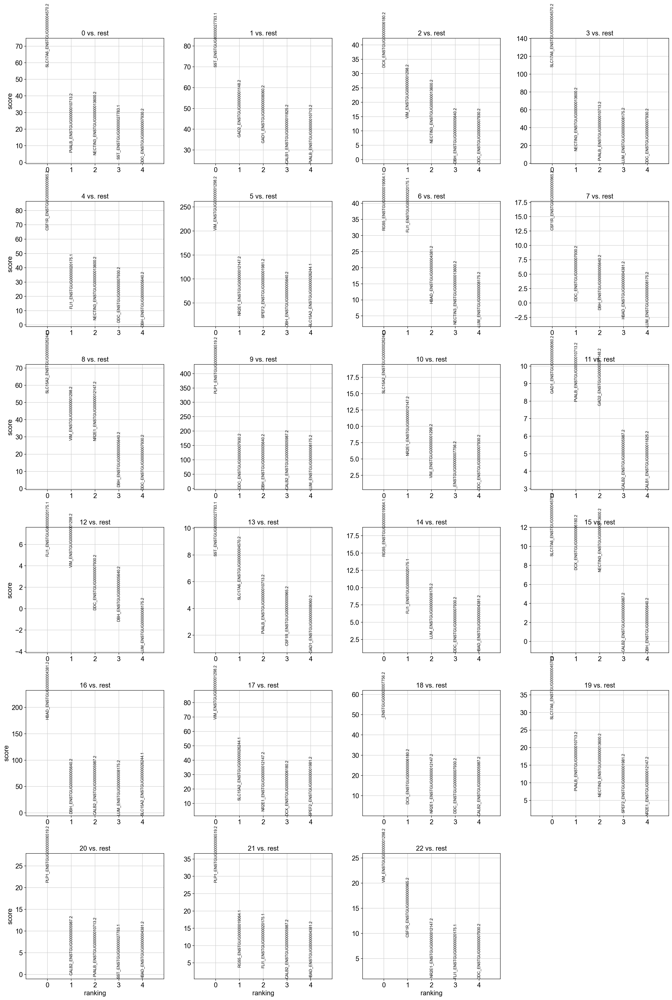

In [55]:
sc.pl.rank_genes_groups(adata_test, n_genes=5, sharey=False, save=False)

### Assign celltypes manually based on marker gene expression in each Leiden cluster

In [56]:
df_leiden = pd.DataFrame()
df_leiden["cluster"] = np.arange(23)
df_leiden["celltype"] = [
    "glutamatergic neurons 1",
    "GABAergic neurons 1",
    "migrating neuroblasts 1",
    "glutamatergic neurons 2",
    "microglia 1",
    "radial glia 1",
    "mural / vascular endothelial cells 1",
    "microglia 2",
    "astrocytes 1",
    "oligodendrocytes 1",
    "astrocytes 2",
    "GABAergic neurons 2",
    "undefined 1",
    "glutamatergic neurons 3",
    "mural cells 1",
    "undefined 2",
    "red blood cells 1",
    "radial glia 2",
    "oligodendrocyte precursor cells 1",
    "glutamatergic neurons 4",
    "oligodendrocytes 2",
    "oligodendrocytes 3",
    "radial glia 3",
]

df_leiden

,cluster,celltype
0,0,glutamatergic neurons 1
1,1,GABAergic neurons 1
2,2,migrating neuroblasts 1
3,3,glutamatergic neurons 2
4,4,microglia 1
5,5,radial glia 1
6,6,mural / vascular endothelial cells 1
7,7,microglia 2
8,8,astrocytes 1
9,9,oligodendrocytes 1


___

# Add manually defined celltypes to AnnData object

In [57]:
# Create copy of leiden cluster column to store manually assigned celltypes
adata.obs["celltype"] = adata.obs.leiden.copy()

In [58]:
# Relabel the clusters in celltype
adata.rename_categories("celltype", df_leiden["celltype"].values)

In [59]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype
barcode,,,,,,,
AAACCCACAAAGACGC-0,zebrafinch,experiment1,886.000000,0,886.000000,0,glutamatergic neurons 1
AAACCCACAGGACTAG-0,zebrafinch,experiment1,3870.000000,0,3870.000000,2,migrating neuroblasts 1
AAACCCACATATTCGG-0,zebrafinch,experiment1,2177.000000,0,2177.000000,8,astrocytes 1
AAACCCAGTATGTCAC-0,zebrafinch,experiment1,7167.000000,0,7167.000000,12,undefined 1
AAACCCATCATACAGC-0,zebrafinch,experiment1,4868.000488,0,4868.000488,7,microglia 2


Also add celltypes to dataframe containing fractions:

In [60]:
df_experiment["celltype"] = df_leiden["celltype"].values
# Sort df by celltype
df_experiment = df_experiment.sort_values(["celltype"])

___

# Celltype stats

Show number of cells for each celltype:

In [61]:
df_leiden["total number of cells"] = adata.obs.groupby("leiden").size().values.astype(int)
df_leiden = df_leiden.sort_values(["celltype"])

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: UserWarning: FixedFormatter should only be used together with FixedLocator
  if sys.path[0] == '':


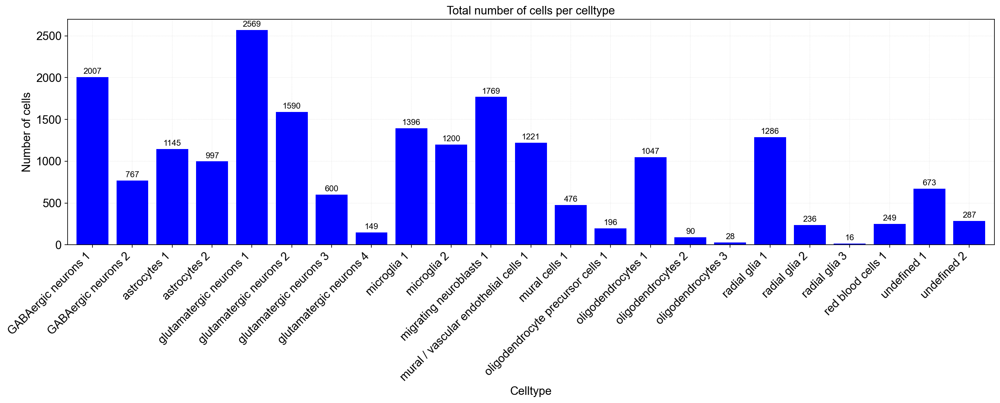

In [62]:
fig, ax = plt.subplots(figsize=(20,5))

clusters = df_leiden["celltype"].values
values = df_leiden["total number of cells"].values

ax.bar(clusters, values, color="blue")

# Add value above each bar
for index, value in enumerate(values):
    ax.text(x = index, y = value + 40, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation = 45, ha="right")

ax.set(**{
    "title": "Total number of cells per celltype",
    "ylabel": "Number of cells",
    "xlabel": "Celltype"
})

ax.margins(x=0.01)
ax.grid(True, ls='--', lw=0.2)
ax.set_axisbelow(True)

fig.show()

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: UserWarning: FixedFormatter should only be used together with FixedLocator
  
/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator


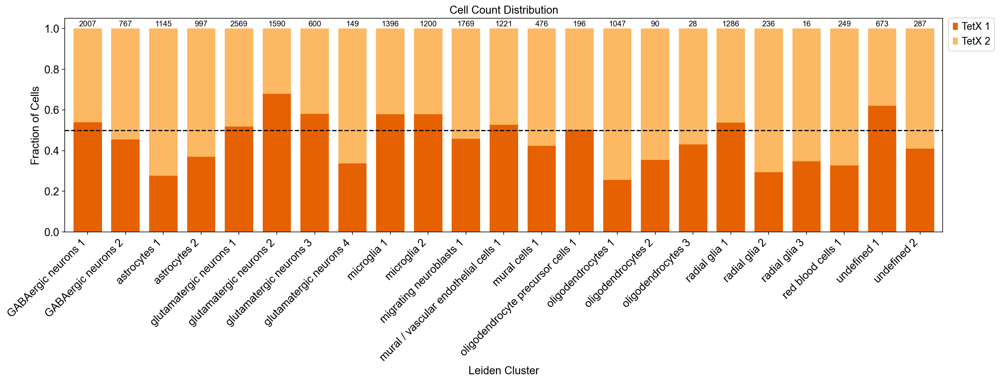

In [63]:
fig, ax = plt.subplots(figsize=(20,5))

clusters = df_experiment.celltype.values
width = 0.75

ax.bar(clusters, df_experiment["experiment1_fraction"].values, width, color=colors[0], label="TetX 1")
ax.bar(clusters, df_experiment["experiment2_fraction"].values, width, bottom=df_experiment["experiment1_fraction"].values, color=colors[1], label="TetX 2")

cellcounts = df_experiment["total number of cells"].values
# Add total cell count above each bar
for index, value in enumerate(cellcounts):
    ax.text(x = index, y = 1.01, s = value, size = 10, ha='center')

ax.set_xticklabels(clusters, rotation = 0, ha="center")
ax.legend(bbox_to_anchor=(1.001, 1.025), loc='upper left')

ax.set(**{
    "title": "Cell Count Distribution",
    "ylabel": "Fraction of Cells",
    "xlabel": "Leiden Cluster"
})

ax.axhline(y=0.5, color='k', linestyle='--')

ax.set_xticklabels(clusters, rotation=45, ha="right")

ax.margins(x=0.01)
ax.grid(False) 

fig.savefig("figures/3.4_cell_count_distribution_tetx.png", dpi=600, bbox_inches='tight')  
fig.savefig("figures/3.4_cell_count_distribution_tetx.pdf", dpi=600, bbox_inches='tight')  

fig.show()

### Plot UMAP with manually assigned celltypes:

In [73]:
# Desired order of the clusters
clusters = np.sort(df_leiden["celltype"].values)

# Reordering celltype labels using categorical data type
adata.obs["celltype"] = adata.obs["celltype"].cat.reorder_categories(list(clusters))

# Reordering leiden labels using categorical data type (so order is same as celltype labels)
adata.obs["leiden"] = adata.obs["leiden"].cat.reorder_categories(list(df_leiden["cluster"].values.astype(str)))

In [74]:
# Define cluster colors
palette = [
    "crimson",
    "orangered",
    "darkblue",
    "cornflowerblue",
    "yellowgreen",
    "darkgreen",
    "mediumseagreen",
    "seagreen",
    "indigo", 
    "orchid",
    "hotpink",
    "teal",
    "mediumturquoise",
    "moccasin",
    "darkorange",
    "gold",
    "wheat",
    "purple",
    "mediumvioletred",
    "pink",
    "firebrick",
    "grey",
    "black"
]

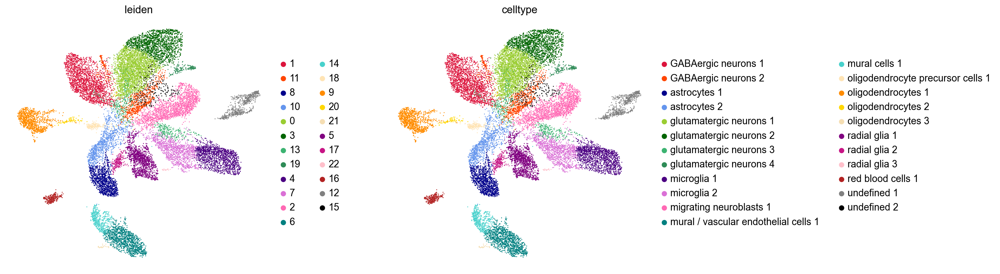

In [75]:
# Plot UMAP and color by Leiden clusters and batch
sc.pl.umap(adata, 
           color=["leiden", "celltype"],
           palette=palette,
           wspace=0.3,
#            arrows=True,
#            projection="3d",
#            save=True
          )

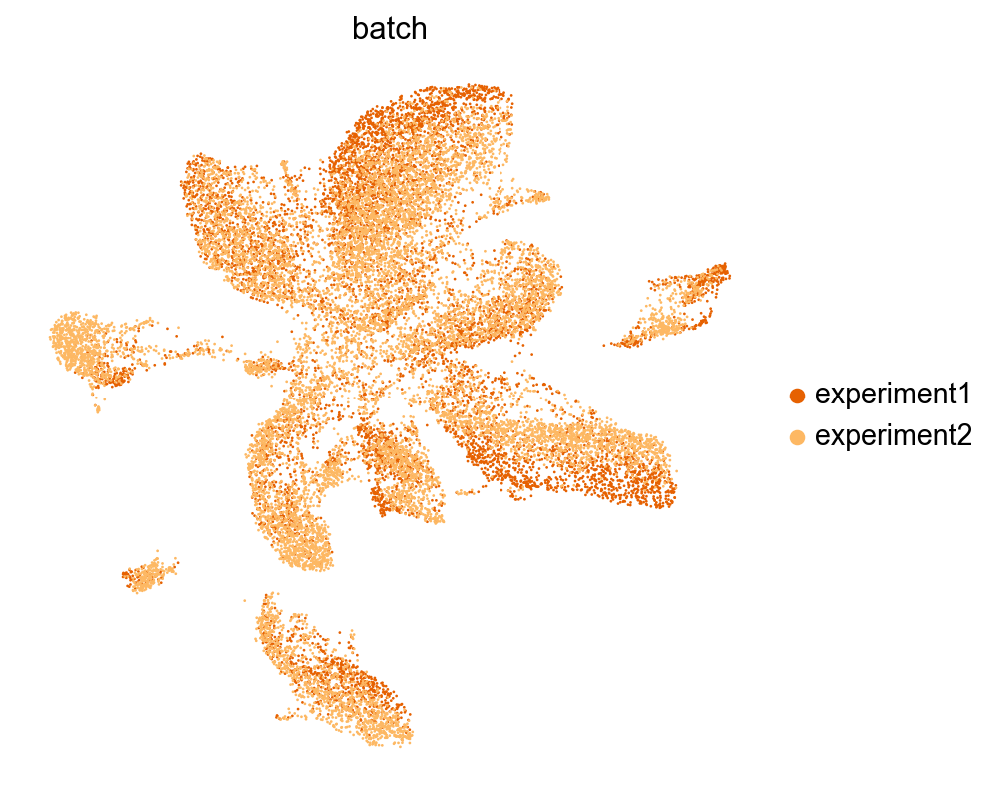

In [76]:
colors = ["#e66101", "#fdb863"]

# Plot 2D UMAP and color by batch
sc.pl.umap(adata, 
           color=["batch"],
           palette=colors,
           wspace=0.3,
           save=True
          ) 

___

# Heatmaps showing expression of known marker genes per celltype 

In [77]:
# Define markers in order of celltypes
markers = [
#     "SNAP25_ENSTGUG00000006133.2",
#     "NAPB_ENSTGUG00000007487.2",
    "GAD1_ENSTGUG00000008060.2",
    "GAD2_ENSTGUG00000001148.2",
    "SST_ENSTGUG00000027783.1",
    "PVALB_ENSTGUG00000010713.2",
    "CALB1_ENSTGUG00000011825.2",
    "CALB2_ENSTGUG00000005987.2",
    "SLC15A2_ENSTGUG00000026244.1",
    "SLC17A6_ENSTGUG00000004570.2",
    "CSF1R_ENSTGUG00000000965.2",
    "DCX_ENSTGUG00000006180.2",
    "RGS5_ENSTGUG00000019064.1",
    "FLI1_ENSTGUG00000020175.1",
    "_ENSTGUG00000007756.2",
    "PLP1_ENSTGUG00000006519.2",
    "VIM_ENSTGUG00000001298.2",
    "HBAD_ENSTGUG00000004381.2",
#         "SPEF2_ENSTGUG00000001981.2",
#         "LUM_ENSTGUG00000008175.2",
#         "DDC_ENSTGUG00000007930.2",
#         "DBH_ENSTGUG00000005640.2",
#         "NR2E1_ENSTGUG00000012147.2",
#         "NECTIN3_ENSTGUG00000013600.2",
]

# # Define marker groups
# var_groups = [
# (0,0)
#     (0, 5),
#     (6, 6),
#     (7, 7),
#     (8, 8),
#     (9, 9),
#     (10, 10),
#     (11, 11),
#     (12, 12),
#     (13, 13),
#     (14, 14),
#     (15, 15)
# ]

# Define marker group labels
var_labels = [
#     "Synaptobrevin"
    "GABAergic neurons",
    "astrocytes",
    "glutamatergic neurons",
    "microglia",
    "migrating neuroblasts",
    "mural cells",
    "vascular endothelial cells",
    "oligodendrocyte precursor cells",
    "oligodendrocytes",
    "radial glia",
    "red blood cells",
    #     "ependymal cells",
    #     "leptomeningeal cells",
    #     "dopaminergic neurons",
    #     "noradrenergic neurons",
    #     "adult neural stem cells",
    #     "GABAergic neuroblast",
]

Heatmap showing expression of previously known marker genes:

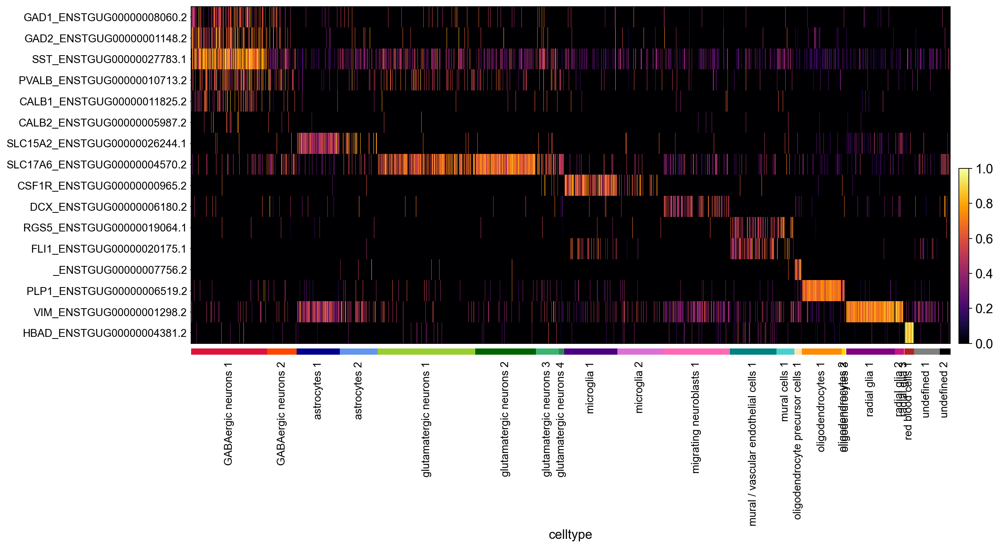

In [82]:
sc.pl.heatmap(
    adata,
    markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
    var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 7),
#     save=True
)

### Marker for large GABAergic neurons in HVC

In [83]:
# adata.var[adata.var.index.str.contains("FST")]

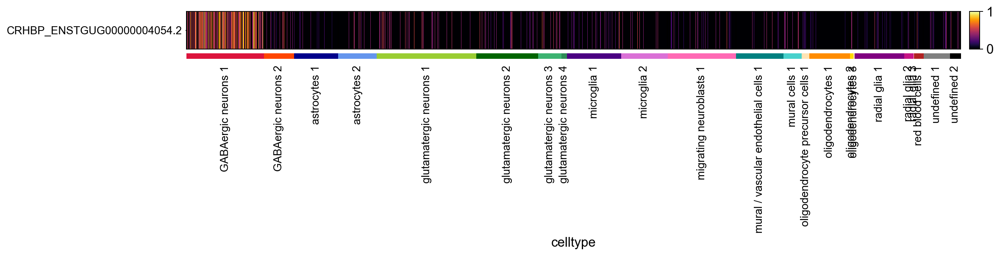

In [84]:
sc.pl.heatmap(
    adata,
    "CRHBP_ENSTGUG00000004054.2",
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 1)
)

# ! Is there a CRHBP-negative cluster here that is not present in CTRL?

Heatmap showing DE genes per celltype:

In [85]:
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order and remove duplications
l_markers = pd.unique(leiden_markers[df_leiden["cluster"].values.astype(str)].head(5).values.ravel('K')) #.ravel('K') makes sure that the values for each columns stay together instead of going per row

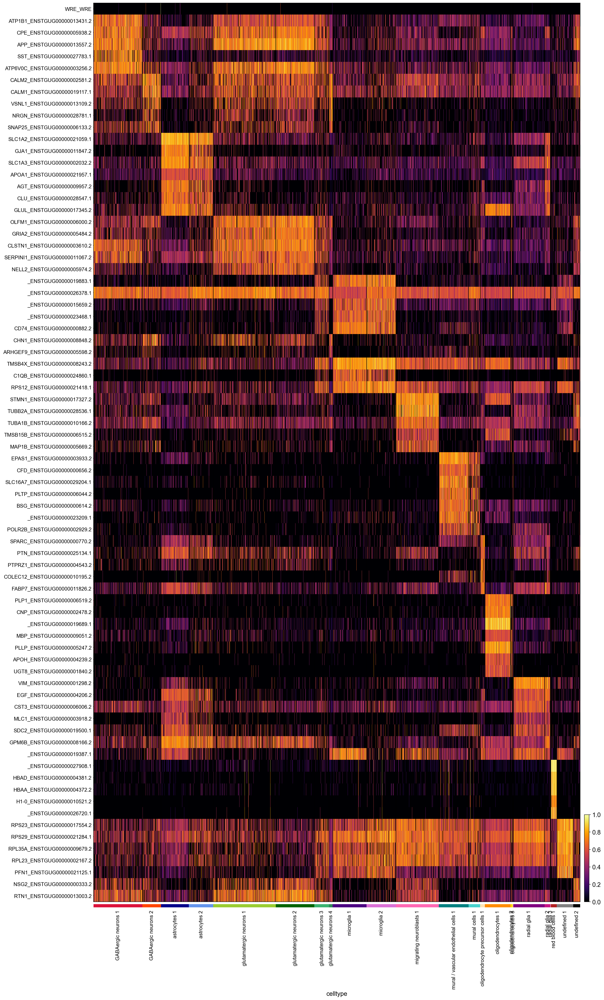

In [86]:
sc.pl.heatmap(
    adata,
    np.concatenate((["WRE_WRE"], l_markers)),
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(20, len(l_markers)/2),
#     save=True
)

In [44]:
df = pd.DataFrame()
# Repeat each cluster 5 times while making sure that cluster order is same as celltype order
df["cluster"] = np.repeat(leiden_markers[df_leiden["cluster"].values.astype(str)].columns, 5)
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order
df["DE gene"] = leiden_markers[df_leiden["cluster"].values.astype(str)].head(5).values.ravel('K')
df["batch"] = "experiment"
df.to_csv("EXP_DE-genes.csv")

# Which celltype could undefined 1 be?
In the heatmap above, the gene expression of undefined 1 looks similar to that of microglia, although the genes are expressed at a lower level. Among the DE genes in this cluster are 4 different ribosomal proteins and PFN1, which regulates actin polymerization in response to extracellular signals. The DE previously known marker genes for undefined 1 (cluster 12) were FLI (vascular endothelial) and VIM (radial glia), although expressed only < 6 SD above the mean.

___

# Assign connectivity (HVC-X / HVC-RA) to glutamatergic neurons

In [45]:
# Drop categories that I do not need for this analysis
conn_mat = marker_gene_mat.filter(["HVC-RA", "HVC-X"], axis=1)
# Drop rows of genes containing only 0s
conn_mat = conn_mat.loc[(conn_mat!=0).any(axis=1)]
conn_mat

,HVC-RA,HVC-X
gene_name_id,,
UTS2B_ENSTGUG00000009278.2,1,0
HPCAL1_ENSTGUG00000013044.2,1,0
DCN_ENSTGUG00000008178.2,0,1
NTS_ENSTGUG00000027877.1,0,1
ALDH1A2_ENSTGUG00000006178.2,0,1
FNDC9_ENSTGUG00000000654.2,0,1


In [46]:
# Find indices of all marker genes in adata
ens_idx = np.isin(adata.var_names, conn_mat.index.values)

# Slice adata based on these indices
adata_conn = adata[:,ens_idx].copy()

# Remove all celltypes but glutamatergic neurons
adata_conn = adata_conn[np.char.startswith(nd(adata_conn.obs.celltype.values).astype(str), "glutamatergic neurons")]

adata_conn

View of AnnData object with n_obs × n_vars = 4908 × 6
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden', 'celltype'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'celltype_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

In [47]:
sc.tl.rank_genes_groups(adata_conn, groupby='celltype', method='t-test', corr_method="bonferroni", use_raw=False)

Trying to set attribute `.uns` of view, copying.


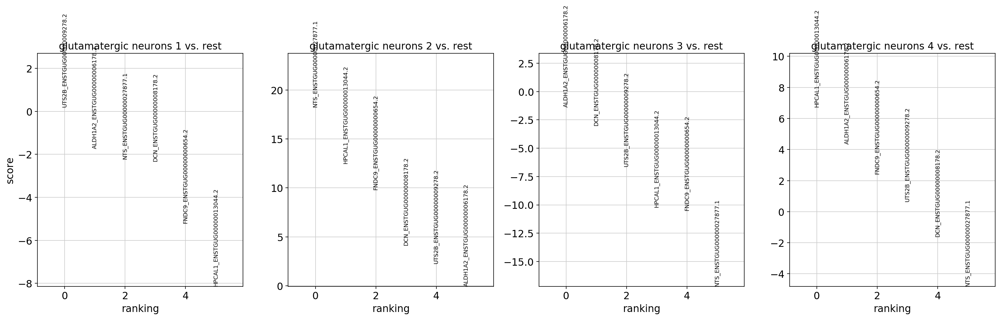

In [48]:
sc.pl.rank_genes_groups(adata_conn, n_genes=6, sharey=False, save=False, ncols=5)

Add assigned connectivity to adata.obs:

In [49]:
# Create copy of leiden cluster column to store manually assigned connectivity
adata.obs["connectivity"] = adata.obs.celltype.copy()

In [50]:
celltypes = nd(adata.obs.celltype.unique())
celltypes

df_connectivity = pd.DataFrame()
df_connectivity["celltypes"] = celltypes
# Using a range of numbers here, otherwise the rename_categories function will not work
df_connectivity["connectivity"] = np.arange(len(celltypes))

# Assign connectivity
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 1"] = "undefined 1"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 2"] = "undefined 2"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 3"] = "undefined 3"
df_connectivity["connectivity"][df_connectivity["celltypes"]=="glutamatergic neurons 4"] = "undefined 4"

# Sort by celltypes (otherwise rename categories does not work correctly)
df_connectivity = df_connectivity.sort_values("celltypes")
df_connectivity

/home/lauraluebbert/bin/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.


,celltypes,connectivity
6,GABAergic neurons 1,6
16,GABAergic neurons 2,16
2,astrocytes 1,2
12,astrocytes 2,12
0,glutamatergic neurons 1,undefined 1
7,glutamatergic neurons 2,undefined 2
14,glutamatergic neurons 3,undefined 3
20,glutamatergic neurons 4,undefined 4
5,microglia 1,5
4,microglia 2,4


In [51]:
adata.rename_categories("connectivity", df_connectivity["connectivity"].values)

In [52]:
adata.obs.head()

,species,batch,n_counts_processed,batch_index,n_counts_raw,leiden,celltype,connectivity
barcode,,,,,,,,
AAACCCACAAAGACGC-0,zebrafinch,experiment1,886.000000,0,886.000000,0,glutamatergic neurons 1,undefined 1
AAACCCACAGGACTAG-0,zebrafinch,experiment1,3870.000000,0,3870.000000,2,migrating neuroblasts 1,1
AAACCCACATATTCGG-0,zebrafinch,experiment1,2177.000000,0,2177.000000,8,astrocytes 1,2
AAACCCAGTATGTCAC-0,zebrafinch,experiment1,7167.000000,0,7167.000000,12,undefined 1,3
AAACCCATCATACAGC-0,zebrafinch,experiment1,4868.000488,0,4868.000488,7,microglia 2,4


### Plot glutamatergic neuron connectivity assignment

In [53]:
# Desired order of the connectivity clusters
conn_clusters = ["undefined 1", "undefined 2", "undefined 3", "undefined 4", 6, 16, 2, 12, 5, 4, 1, 10, 19, 11, 18, 13, 21, 8, 9, 22, 17, 3, 15]

# Reordering connectivity labels using categorical data type
adata.obs["connectivity"] = adata.obs["connectivity"].cat.reorder_categories(list(conn_clusters))

In [54]:
palette_glut = [
    "yellowgreen",
    "darkgreen",
    "mediumseagreen",
    "seagreen",
]

All glut neurons for reference:

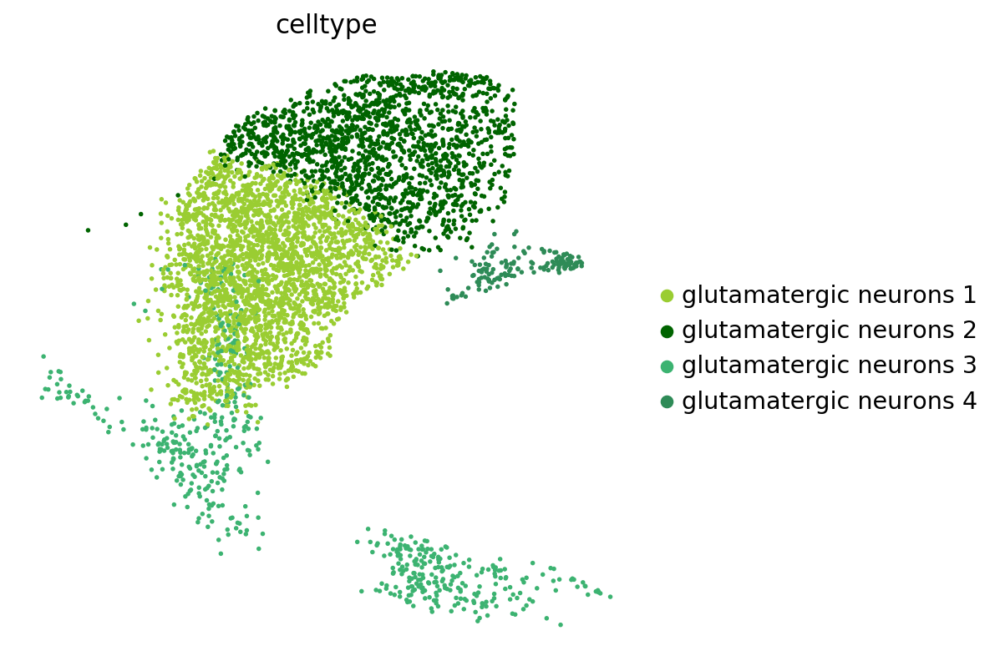

In [55]:
sc.pl.umap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    color=["celltype"],
    ncols=1
)

Connectivity:

Trying to set attribute `.uns` of view, copying.


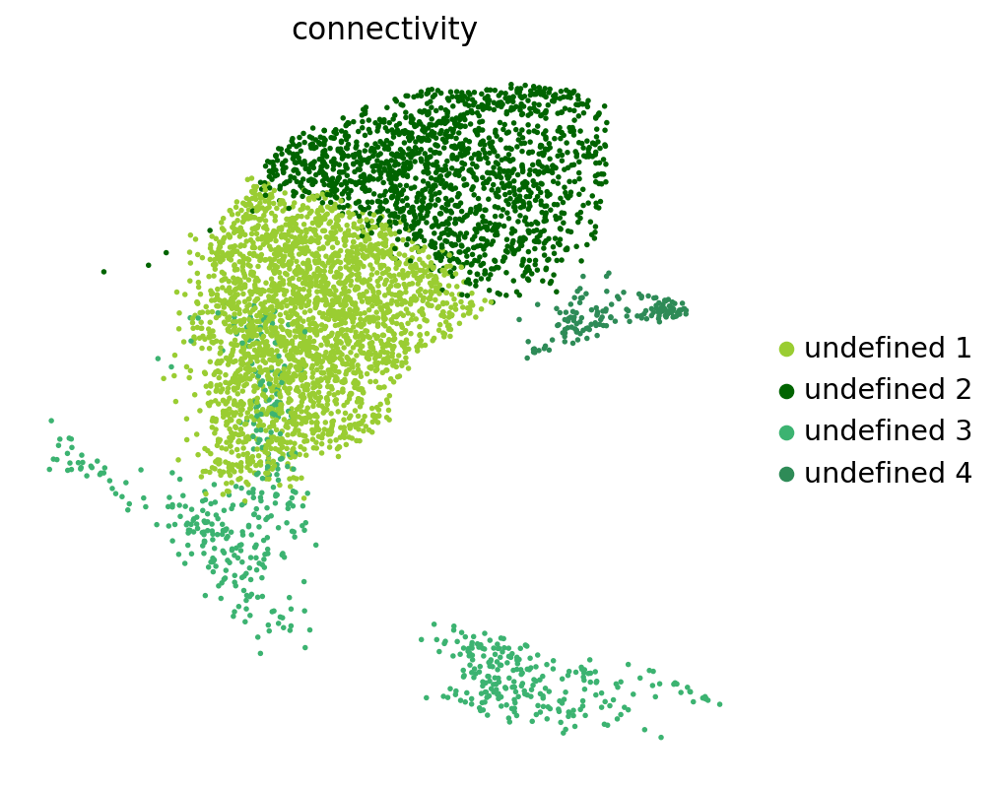

In [56]:
sc.pl.umap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    color=["connectivity"],
    palette=palette_glut,
    ncols=1
)

This assignment makes sense given that WRE is expressed mostly in WRE (see graph below of WRE expression). We do not know why AAVs target HVC-X more succesfully than HVC-RA neurons, but this coincides with what we previouly observed in the lab based on overlap between viral fluorophore expression and tracers from RA or from X.

In [57]:
markers = [
    "UTS2B_ENSTGUG00000009278.2",
    "HPCAL1_ENSTGUG00000013044.2",
    "ALDH1A2_ENSTGUG00000006178.2",
    "DCN_ENSTGUG00000008178.2",
    "FNDC9_ENSTGUG00000000654.2",
    "NTS_ENSTGUG00000027877.1",
    "SST_ENSTGUG00000027783.1",
    "PVALB_ENSTGUG00000010713.2",
    "CALB1_ENSTGUG00000011825.2",
    "CALB2_ENSTGUG00000005987.2",
    "BDNF_ENSTGUG00000004743.2",
    "FOSL2_ENSTGUG00000024611.1",
    "HOMER1_ENSTGUG00000003711.2",
    "ARC_ENSTGUG00000012727.2",
    "TNFAIP8L3_ENSTGUG00000028388.1",
    "EGR1_ENSTGUG00000000003.2",
]

Check expression of markers in all cells:

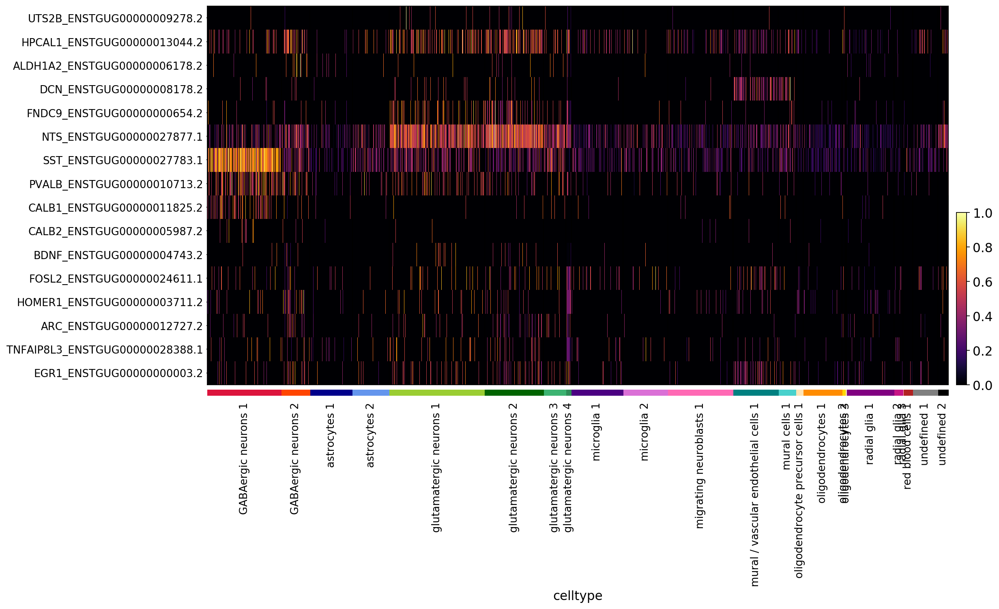

In [58]:
sc.pl.heatmap(
    adata,
    markers,
    groupby="celltype",
    show_gene_labels=True,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, len(markers)/2)
)

Check expression of markers in glutamatergic neurons:

Trying to set attribute `.uns` of view, copying.


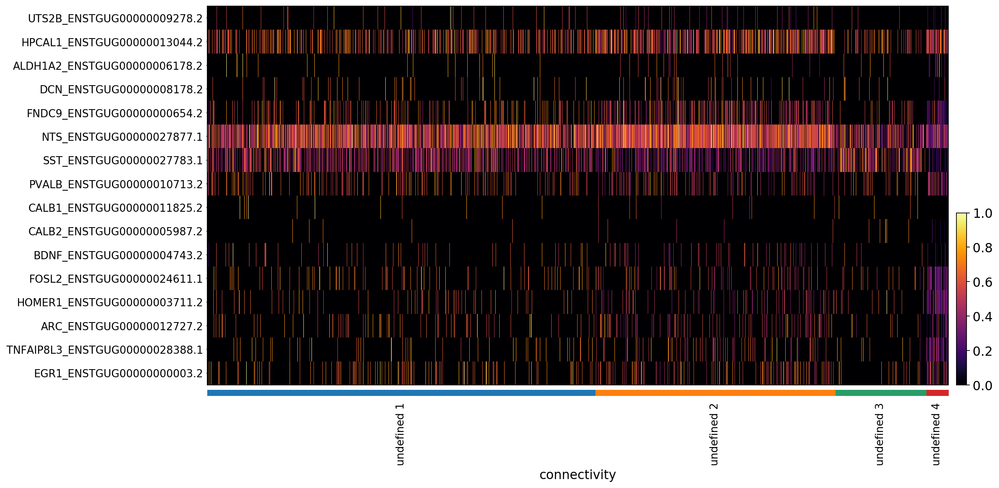

In [55]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    markers,
    groupby="connectivity",
    show_gene_labels=True,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, len(markers)/2)
)

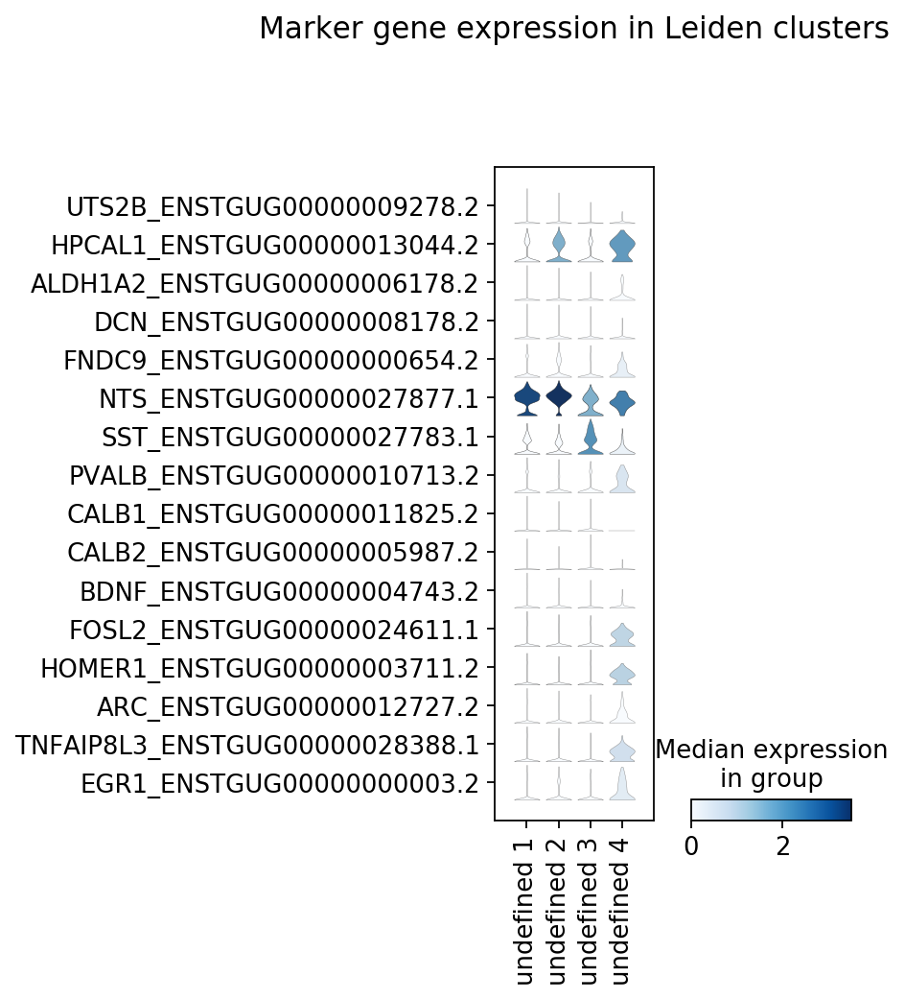

In [56]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     markers, 
                     groupby='connectivity', 
                     title="Marker gene expression in Leiden clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True
                    )

UTS2B (Urotensin 2B): Among its related pathways are Peptide ligand-binding receptors and Signaling by GPCR. Gene Ontology (GO) annotations related to this gene include hormone activity and G protein-coupled receptor binding.  

HPCAL1 (Hippocalcin Like 1): The protein encoded by this gene is a member of neuron-specific calcium-binding proteins family found in the retina and brain. It is highly similar to human hippocalcin protein and nearly identical to the rat and mouse hippocalcin like-1 proteins. It may be involved in the calcium-dependent regulation of rhodopsin phosphorylation and may be of relevance for neuronal signalling in the central nervous system.   

ALDH1A2 (Aldehyde Dehydrogenase 1 Family Member A2): This protein belongs to the aldehyde dehydrogenase family of proteins. The product of this gene is an enzyme that catalyzes the synthesis of retinoic acid (RA) from retinaldehyde. Retinoic acid, the active derivative of vitamin A (retinol), is a hormonal signaling molecule that functions in developing and adult tissues. The studies of a similar mouse gene suggest that this enzyme and the cytochrome CYP26A1, concurrently establish local embryonic retinoic acid levels which facilitate posterior organ development and prevent spina bifida.  

DCN (decorin): This gene encodes a member of the small leucine-rich proteoglycan family of proteins. Alternative splicing results in multiple transcript variants, at least one of which encodes a preproprotein that is proteolytically processed to generate the mature protein. This protein plays a role in collagen fibril assembly. Binding of this protein to multiple cell surface receptors mediates its role in tumor suppression, including a stimulatory effect on autophagy and inflammation and an inhibitory effect on angiogenesis and tumorigenesis.

FNDC9 (Fibronectin Type III Domain Containing 9): Fibronectin is a high-molecular weight glycoprotein of the extracellular matrix that binds to membrane-spanning receptor proteins called integrins (https://en.wikipedia.org/wiki/Fibronectin).

NTS (Neurotensin): This gene encodes a common precursor for two peptides, neuromedin N and neurotensin. Neurotensin is a secreted tridecapeptide, which is widely distributed throughout the central nervous system, and may function as a neurotransmitter or a neuromodulator. It may be involved in dopamine-associated pathophysiological events, in the maintenance of gut structure and function, and in the regulation of fat metabolism. Neurotensin also exhibits antimicrobial activity against bacteria and fungi. Tissue-specific processing may lead to the formation in some tissues of larger forms of neuromedin N and neurotensin. The large forms may represent more stable peptides that are also biologically active.

Info from GeneCards unless otherwise noted

Heatmap showing DE genes per celltype:

In [57]:
# Get first 5 DE genes for each Leiden cluster while making sure that cluster order is same as celltype order and remove duplications
l_markers_conn = pd.unique(leiden_markers[["0","3","13","19"]].head(5).values.ravel('K')) #.ravel('K') makes sure that the values for each columns stay together instead of going per row

Trying to set attribute `.uns` of view, copying.


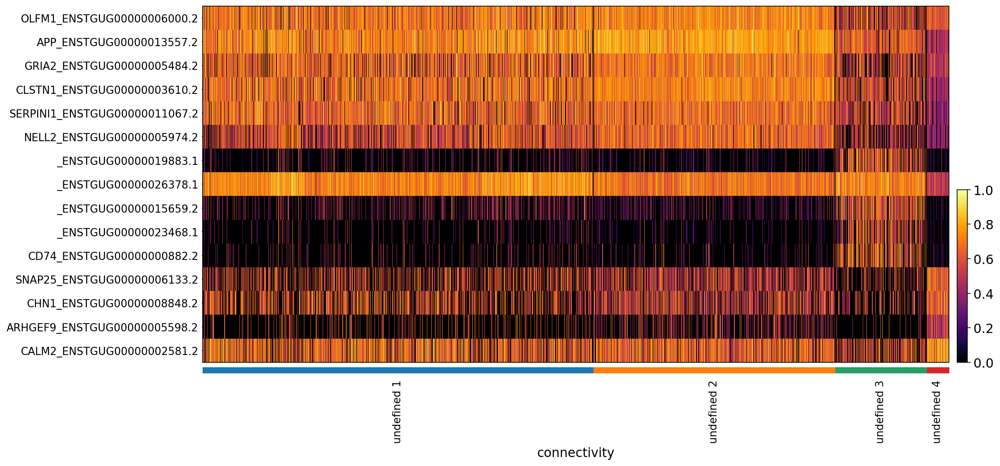

In [58]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    l_markers_conn,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, len(l_markers_conn)/2)
)

___

# Compare to DE genes found in CTRL HVC-RA & -X

In [59]:
hvcxra_markers_top5 = [
    "_ENSTGUG00000008926.2",
    "PENK_ENSTGUG00000011112.2",
    "CXCL14_ENSTGUG00000017226.2",
    "_ENSTGUG00000001973.2",
    "NPTX2_ENSTGUG00000008623.2",
    "CCK_ENSTGUG00000004682.2",
    "NTS_ENSTGUG00000027877.1",
    "CHL1_ENSTGUG00000009997.2",
    "PTN_ENSTGUG00000025134.1",
    "VIP_ENSTGUG00000020465.1",
]

Trying to set attribute `.uns` of view, copying.


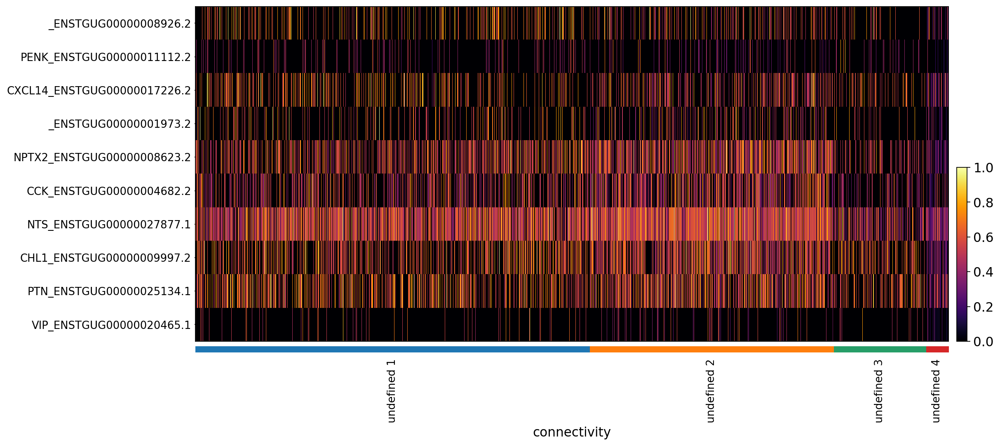

In [60]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    hvcxra_markers_top5,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 7)
)

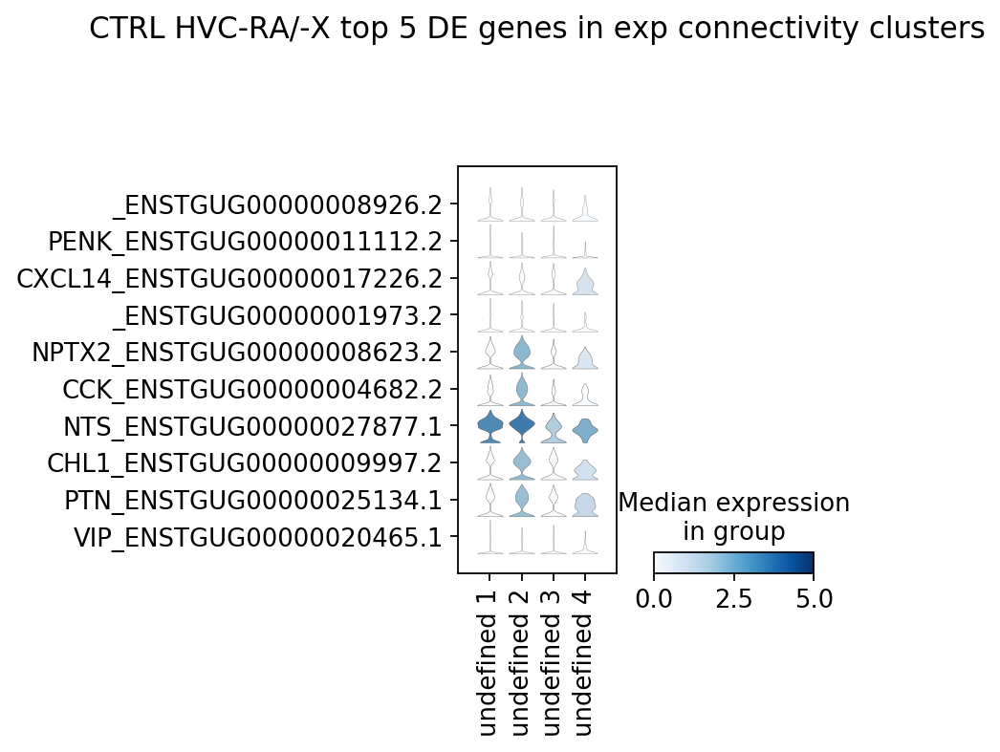

In [61]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     hvcxra_markers_top5, 
                     groupby='connectivity', 
                     title="CTRL HVC-RA/-X top 5 DE genes in exp connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
                     vmin=0,
                     vmax=5   
                    )

# Hypothesis: Undefined glut neurons 1 and 3 from exp look like underfined 1 from CTRL (which we hypothesize is immature HVC-RA) and undefined 2 (and 4?) from exp look like underfined 2 from CTRL (which we hypothesize is immature HVC-X).
To test this hypothesis, I will cluster undefined 1 and 2 from CTRL, and all glut experiment together to see if they cluster toether as expected. See notebook EXP_vs_CTRL_separate.

___

# Colquitt HVC_Glut markers
GFRA1 (HVC_Glut-1/4), BDNF (HVC_Glut-4), GRIA4 (HVC_Glut-2), SCUBE1 (HVC_Glut-3), CACNA1G (HVC_Glut-5).

![Cat](colquitt_glut.jpg)

In [62]:
colquitt = [
    "SLC17A6_ENSTGUG00000004570.2",
    "GFRA1_ENSTGUG00000018882.1",
    "GRIA4_ENSTGUG00000012676.2",
    "SCUBE1_ENSTGUG00000012016.2",
    "CACNA1G_ENSTGUG00000009049.2",
    "BDNF_ENSTGUG00000004743.2",
]

Trying to set attribute `.uns` of view, copying.


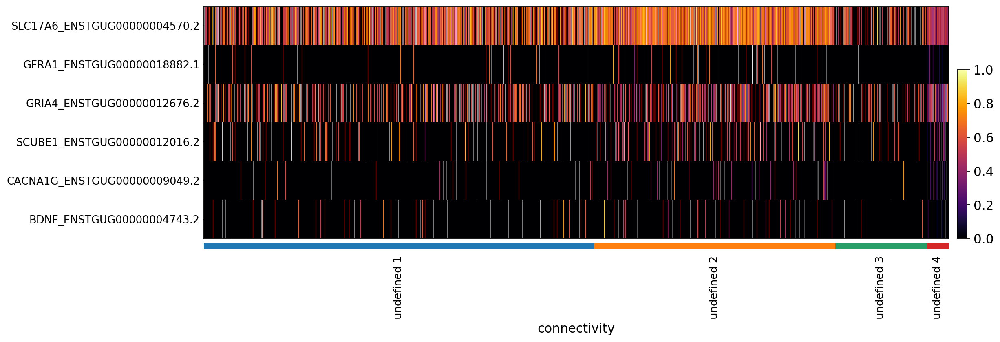

In [63]:
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    colquitt,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=True,
    figsize=(15, 5)
)

HVC-X: SCUBE1  
HVC-RA: GFRA1, BDNF (activity)  
immature HVC-RA ? : GRIA4  

The HVC_Glut-1 and HVC_Glut-4 marker gene GFRA1 was elevated in retrogradely identified HVCRA neurons (fig. S2, F and G), and these clusters express relatively high levels of the previously identified HVCRA marker UTS2B (26) (fig. S2, A and H). The expression of several activity-dependent genes (BDNF, HOMER1, and FOSL2) suggests that HVC_Glut-4 may represent an active population of HVC_Glut-1 neurons (Fig. 2C and fig. S2, A and I). [...] The HVC_Glut-3 marker SCUBE1 was elevated in retrogradely labeled HVCX neurons (fig. S2, F and G), and HVC_Glut-3 was enriched for the known HVCX marker NTS (31) (fig. S2, A and H). Although marker genes for HVCAv have not yet been reported, the abundance of cells in HVC_Glut-5 (~2% of projection neurons) is comparable to that seen in a previous retrograde tracing analysis of HVCAv neurons (25) (fig. S1J). [...] HVC_Glut-2 lies at the terminus of the neurogenic lineage (Fig. 1E) and is enriched for genes involved in dendritogenesis and synaptogenesis (fig. S1G) and therefore may constitute an immature population of HVCRA neurons, which are known to undergo replacement in adult songbirds (17–20).

### Are these enriched for neurogenesis markers?

In [64]:
neurogenesis = marker_gene_mat.loc[marker_gene_mat['mammalian neurogenesis'] != 0].index.values

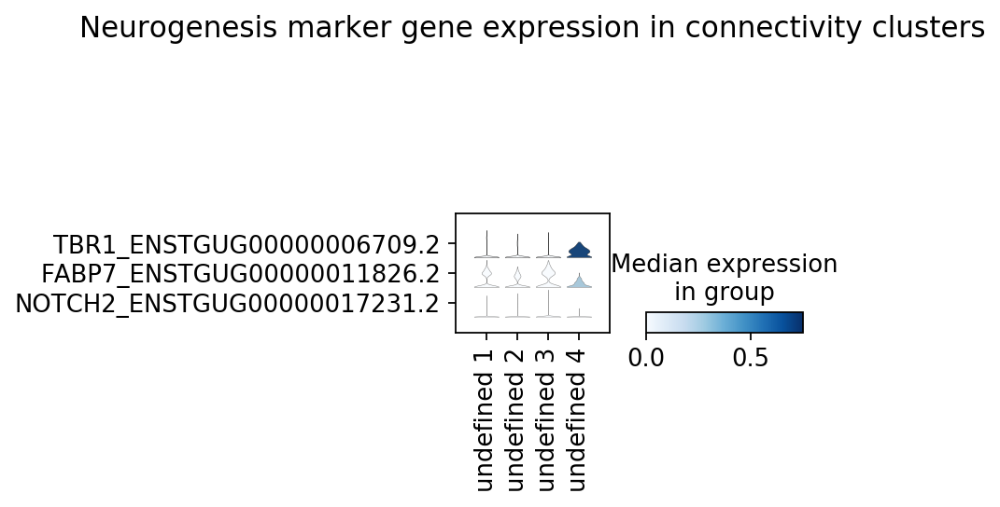

In [65]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     neurogenesis, 
                     groupby='connectivity', 
                     title="Neurogenesis marker gene expression in connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
                     vmin=0,
                     vmax=0.75
                    )

___ 

# DE genes undefined 1 versus undefined 2

In [66]:
adata_u1 = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "undefined 1")]
adata_u2 = adata[np.char.startswith(nd(adata.obs.connectivity.values).astype(str), "undefined 2")]

adata_u1_u2 = adata_u1.concatenate(adata_u2, 
                             join='outer', 
                             batch_key='batch_index', 
                             batch_categories=None, 
                             uns_merge=None,
                             fill_value=np.nan)

In [67]:
sc.tl.rank_genes_groups(adata_u1_u2, groupby='connectivity', method='t-test', corr_method="bonferroni", use_raw=False)

... storing 'leiden' as categorical
... storing 'celltype' as categorical
... storing 'connectivity' as categorical


Score = z-score underlying the computation of a p-value for each gene for each group

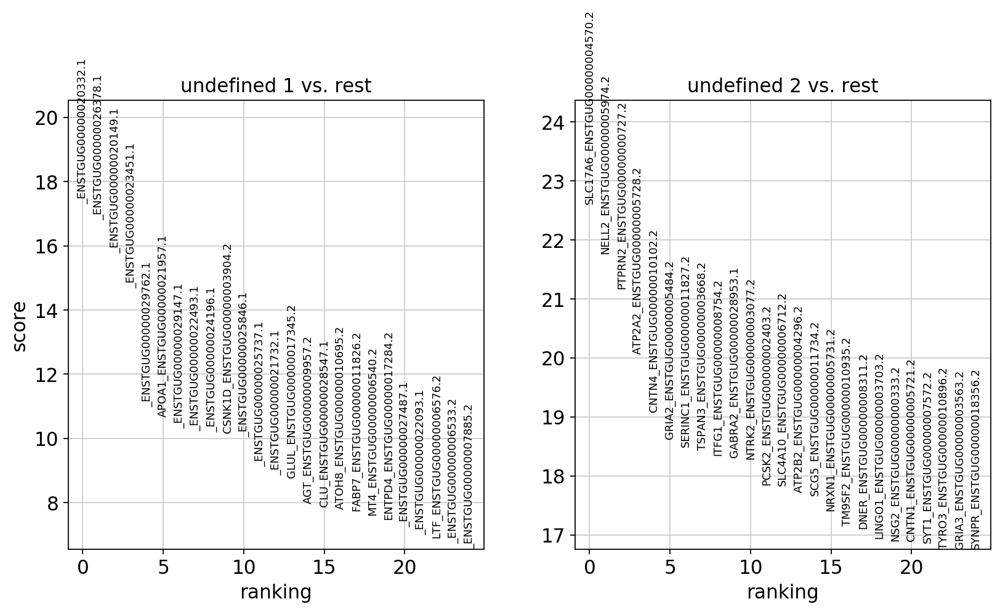

In [68]:
sc.pl.rank_genes_groups(adata_u1_u2, n_genes=25, sharey=False, save=False)

In [69]:
hvcu1u2_markers = pd.DataFrame(adata_u1_u2.uns['rank_genes_groups']['names']).head(20)
hvcu1u2_markers.head()

,undefined 1,undefined 2
0,_ENSTGUG00000020332.1,SLC17A6_ENSTGUG00000004570.2
1,_ENSTGUG00000026378.1,NELL2_ENSTGUG00000005974.2
2,_ENSTGUG00000020149.1,PTPRN2_ENSTGUG00000000727.2
3,_ENSTGUG00000023451.1,ATP2A2_ENSTGUG00000005728.2
4,_ENSTGUG00000029762.1,CNTN4_ENSTGUG00000010102.2


___

# Final figure

In [60]:
all_markers = [
    "SLC17A6_ENSTGUG00000004570.2",
    "UTS2B_ENSTGUG00000009278.2",
    "HPCAL1_ENSTGUG00000013044.2",
    "ALDH1A2_ENSTGUG00000006178.2",
    "DCN_ENSTGUG00000008178.2",
    "FNDC9_ENSTGUG00000000654.2",
    "NTS_ENSTGUG00000027877.1",
#    
    "_ENSTGUG00000008926.2", 
    'PENK_ENSTGUG00000011112.2',
    'CXCL14_ENSTGUG00000017226.2', 
    '_ENSTGUG00000001973.2',
    'NPTX2_ENSTGUG00000008623.2',
#    
    'CCK_ENSTGUG00000004682.2',
    'NTS_ENSTGUG00000027877.1',
    'CHL1_ENSTGUG00000009997.2',
    'PTN_ENSTGUG00000025134.1',
    'VIP_ENSTGUG00000020465.1',
#    
    "GFRA1_ENSTGUG00000018882.1",
    "SCUBE1_ENSTGUG00000012016.2",    
    "CACNA1G_ENSTGUG00000009049.2",
    "GRIA2_ENSTGUG00000005484.2",
    "GRIA4_ENSTGUG00000012676.2",
#
    "BDNF_ENSTGUG00000004743.2",
    "FOSL2_ENSTGUG00000024611.1",
    "HOMER1_ENSTGUG00000003711.2",
    "ARC_ENSTGUG00000012727.2",
    "TNFAIP8L3_ENSTGUG00000028388.1",
    "EGR1_ENSTGUG00000000003.2",
#    
    'TBR1_ENSTGUG00000006709.2', 
    'FABP7_ENSTGUG00000011826.2',
    'NOTCH2_ENSTGUG00000017231.2',
    "NELL1_ENSTGUG00000004458.2",
#
    "_ENSTGUG00000017273.2",
    "_ENSTGUG00000028417.1",
    "_ENSTGUG00000004607.2",
#
    "NPTXR_ENSTGUG00000024678.1",
    "NPTX1_ENSTGUG00000025297.1", 
    "NPTX2_ENSTGUG00000008623.2",  
    "NRXN1_ENSTGUG00000005731.2",
    "CNTN4_ENSTGUG00000010102.2",
    "CACNA2D1_ENSTGUG00000002536.2",
]

# Define marker groups
var_groups = [
    (0, 0),
    (1, 2),
    (3, 6),
    (7, 11),
    (12, 16),
    (17, 17),
    (18, 18),
    (19, 19),
    (20, 20),
    (21, 21),
    (22, 27),
    (28, 31),
    (32, 34),
    (35, 40)
]

# Define marker group labels
var_labels = [
    "Glutamatergic neuron marker",
    "HVC-RA markers",
    "HVC-X markers",
    "HVC-RA DE genes in CTRL",
    "HVC-X DE genes in CTRL",
    "Colquitt HVC-RA",
    "Colquitt HVC-X",
    "Colquitt HVCAv",
    "Torok undefined",
    "Colquitt immature HVC-RA?",
    "Neuronal activity markers",
    "Neurogenesis markers",
    "MHC-associated",
    "Synaptogenesis (DE from CTRL undefined)"
]

Trying to set attribute `.uns` of view, copying.


Experiment


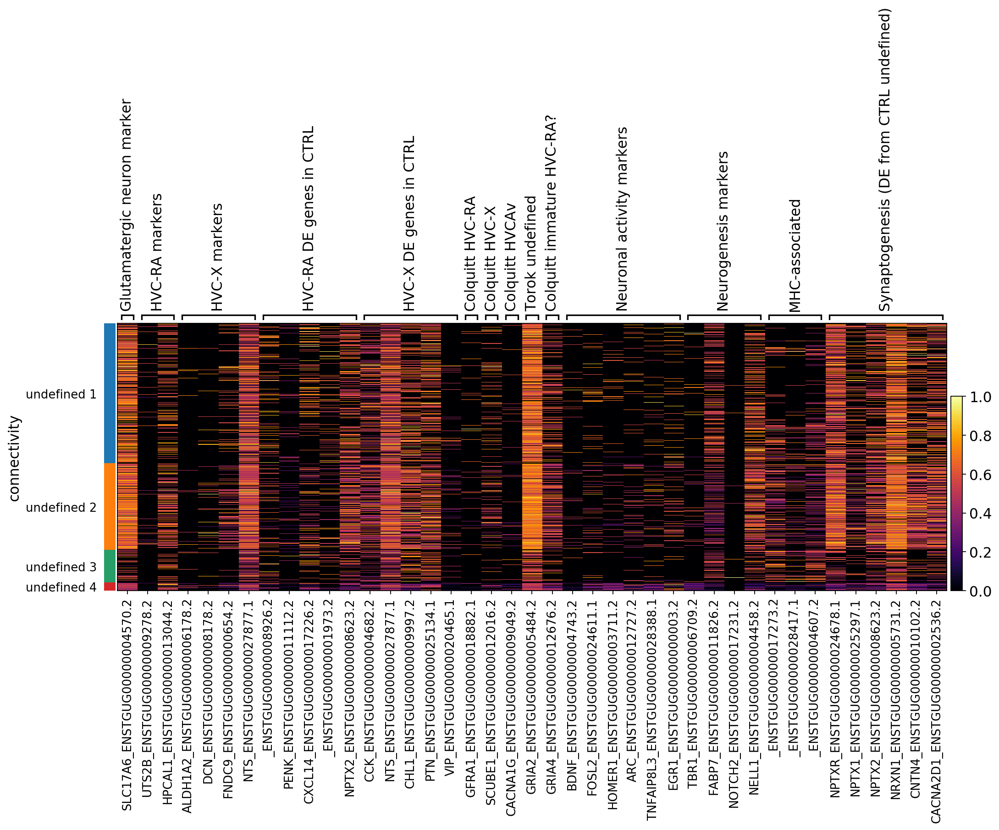

In [71]:
print("Experiment")
sc.pl.heatmap(
    adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")],
    all_markers,
    groupby="connectivity",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
    var_group_positions=var_groups,
    var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(15, 5)
)

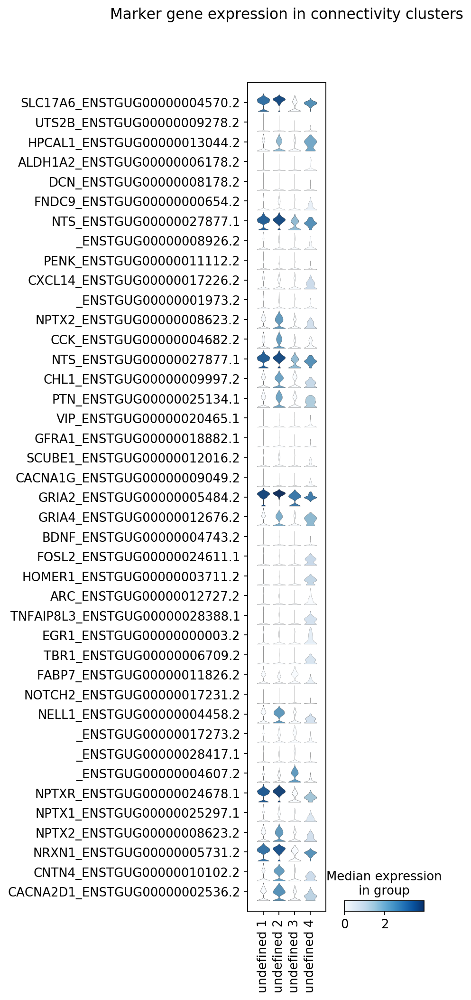

In [72]:
sc.pl.stacked_violin(adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glutamatergic neurons")], 
                     all_markers, 
                     groupby='connectivity', 
                     title="Marker gene expression in connectivity clusters", 
                     rotation=90, 
                     sharey=True,
                     use_raw=False,
                     swap_axes=True,
#                      vmin=0,
#                      vmax=0.75
                    )

Confirm that these markers are not expressed in another cluster:

Experiment


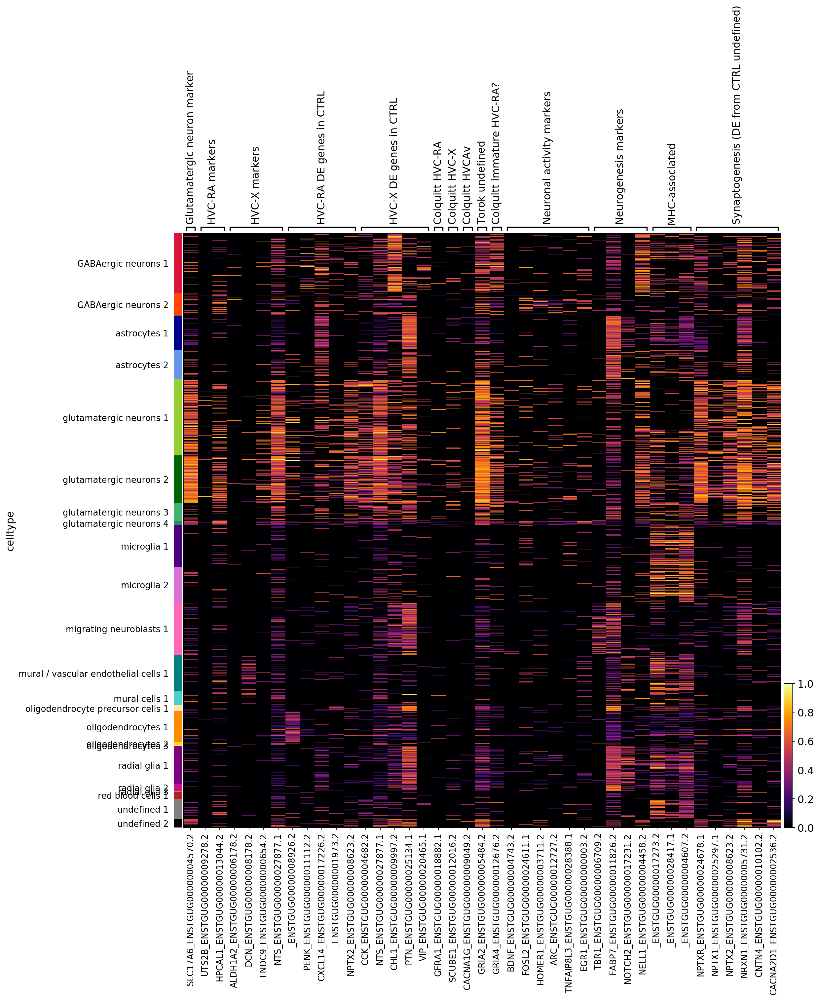

In [62]:
print("Experiment")
sc.pl.heatmap(
    adata,
    all_markers,
    groupby="celltype",
#     dendrogram=True, # This messes up the ordering of the celltypes
    show_gene_labels=True,
    var_group_positions=var_groups,
    var_group_labels=var_labels,
#     var_group_rotation=1,
    use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
    cmap="inferno", # Alternative cmap: magma
    standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
    swap_axes=False,
    figsize=(15, 15)
)

____

# Recluster exp. glutamatergic neurons since HVC-X / -RA assignment unclear

In [73]:
# Get only glutamatergic neurons
adata_glut = adata[np.char.startswith(nd(adata.obs.celltype.values).astype(str), "glut")].copy()
adata_glut

AnnData object with n_obs × n_vars = 4908 × 22151
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden', 'celltype', 'connectivity'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'celltype_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

Leiden clustering of only glut neurons

In [74]:
# Leiden clustering on the neighboorhood graph
sc.tl.leiden(adata_glut, random_state=0)

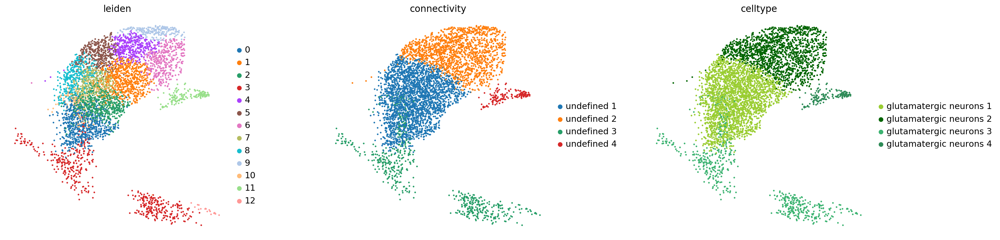

In [75]:
# Plot UMAP and color by Leiden clusters and batch
sc.pl.umap(adata_glut, 
           color=["leiden", "connectivity", "celltype"],
           wspace=0.3
          )

In [76]:
# Find indices of all HVC-X/ -RA marker genes in adata_glut
ens_idx = np.isin(adata_glut.var_names, conn_mat.index.values)

# Slice adata based on these indices
adata_glut_conn = adata_glut[:,ens_idx].copy()

adata_glut_conn

AnnData object with n_obs × n_vars = 4908 × 6
    obs: 'species', 'batch', 'n_counts_processed', 'batch_index', 'n_counts_raw', 'leiden', 'celltype', 'connectivity'
    var: 'gene_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_colors', 'hvg', 'leiden', 'leiden_colors', 'neighbors', 'pca', 'umap', 'rank_genes_groups', 'celltype_colors', 'connectivity_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'raw'
    obsp: 'connectivities', 'distances'

In [77]:
sc.tl.rank_genes_groups(adata_glut_conn, groupby='leiden', method='t-test', corr_method="bonferroni", use_raw=False)

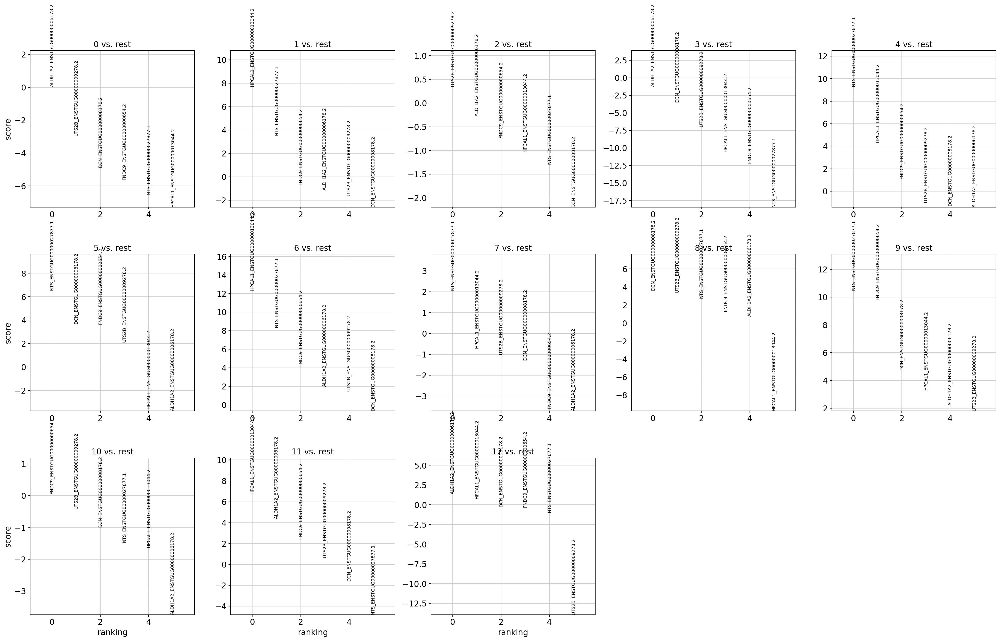

In [78]:
sc.pl.rank_genes_groups(adata_glut_conn, n_genes=6, sharey=False, save=False, ncols=5)

In [83]:
# print("Experiment")
# sc.pl.heatmap(
#     adata_glut_conn,
#     all_markers,
#     groupby="connectivity",
# #     dendrogram=True, # This messes up the ordering of the celltypes
#     show_gene_labels=True,
#     var_group_positions=var_groups,
#     var_group_labels=var_labels,
# #     var_group_rotation=1,
#     use_raw=False, # By default adata.raw.X is plotted. If use_raw=False is set, then adata.X is plotted. 
#     cmap="inferno", # Alternative cmap: magma
#     standard_scale="var", # standardize that dimension between 0 and 1, meaning for each variable or observation, subtract the minimum and divide each by its maximum
#     swap_axes=False,
#     figsize=(15, 5)
# )

It is impossible to assign HVC-X/ -RA connectivity to the glutamatergic neuron clusters from the experiment datasets based on the known marker genes. This continues to be the case even after further subclustering of the glutamatergic neurons.

___

# Save experiment dataset with celltype assignment

In [80]:
# # Convert connectivity to string, otherwise .write does not work
# adata.obs["connectivity"] = adata.obs["connectivity"].astype(str)

In [81]:
# adata.write("../../finchseq_data/exp_celltype.h5ad")

... storing 'connectivity' as categorical
